In [22]:
!ls cv_master

__init__.py       cv.py             dataclass.py      satellite_data.py
__pycache__       data              grid.py           utils.py


In [18]:
column_labels = ['y coordinate',
                'x coordinate',
                'expert_label',
                'NDAI',
                'SD',
                'CORR',
                'Radiance angle DF',
                'Radiance angle CF',
                'Radiance angle BF',
                'Radiance angle AF',
                'Radiance angle AN']

In [23]:
import pandas as pd
imagem1 = pd.read_csv('cv_master/data/imagem1.txt',delim_whitespace=True, header=None)
imagem2 = pd.read_csv('cv_master/data/imagem2.txt',delim_whitespace=True, header=None)
imagem3 = pd.read_csv('cv_master/data/imagem3.txt',delim_whitespace=True, header=None)

imagem1.columns = column_labels
imagem2.columns = column_labels
imagem3.columns = column_labels

imagem1['Image_no'] = 1
imagem2['Image_no'] = 2
imagem3['Image_no'] = 3

image_set = pd.concat([imagem1, imagem2, imagem3],0)

/var/folders/0p/10_vdl_n673_r_lydsdd278m0000gn/T/ipykernel_77251/1169984484.py:14: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  image_set = pd.concat([imagem1, imagem2, imagem3],0)


In [27]:
image_set['expert_label'].value_counts()

 0.0    137495
-1.0    127080
 1.0     80981
Name: expert_label, dtype: int64

In [ ]:
remap_labels = {1:1,
                -1:0,
                0:2}

In [29]:
check = image_set['expert_label'].apply(lambda x: remap_labels[x])

In [30]:
image_set['expert_label']

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
115212    0.0
115213    0.0
115214    0.0
115215    0.0
115216    0.0
Name: expert_label, Length: 345556, dtype: float64

In [32]:
check.value_counts()

2    137495
0    127080
1     80981
Name: expert_label, dtype: int64

In [73]:
label_names = {1:'cloud',
               -1:'not cloud',
               0:'unlabeled'}

image_set['named_label'] = image_set['expert_label'].apply(lambda x: label_names[x])

# Question 1

EDA

In [82]:
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

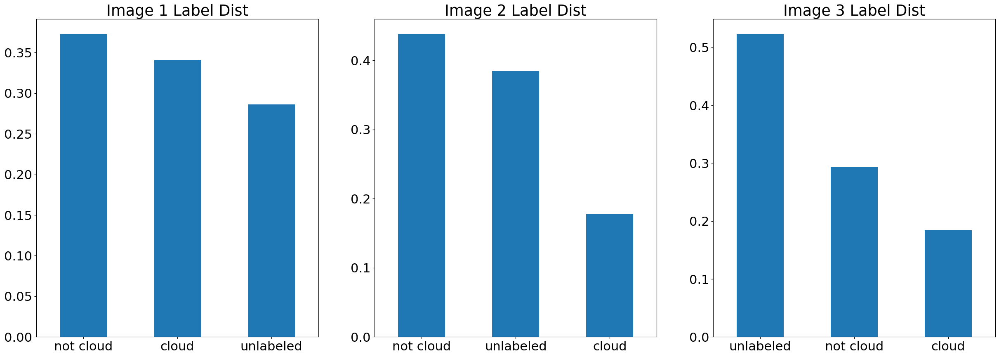

In [87]:
matplotlib.rcParams.update({'font.size': 22})
fig,ax = plt.subplots(1,3,figsize=(30,10))

for i in [1,2,3]:
    
    im_subset = image_set[image_set['Image_no']==i]
    
    im_subset['named_label'].value_counts(normalize=True).plot.bar(ax=ax[i-1],rot=0)

    ax[i-1].set_title(f'Image {i} Label Dist')

In [215]:
len(imagem1)

115110

In [216]:
len(imagem2)

115229

In [217]:
len(imagem3)

115217

In [221]:
imagem1

,y coordinate,x coordinate,expert_label,NDAI,SD,CORR,Radiance angle DF,Radiance angle CF,Radiance angle BF,Radiance angle AF,Radiance angle AN,Image_no
0,352.0,65.0,0.0,1.716874,14.327700,0.198324,286.80087,213.60213,215.52872,200.47234,184.52251,1
1,353.0,65.0,0.0,1.498417,11.641967,0.233821,256.42563,232.64897,228.68259,196.27235,181.85898,1
2,354.0,65.0,0.0,2.098988,12.378335,0.250463,242.92738,244.57222,230.25035,189.34863,186.37204,1
3,355.0,65.0,0.0,2.573375,10.942639,0.222701,255.12035,262.46069,223.46631,194.81055,201.93175,1
4,356.0,65.0,0.0,2.155032,6.143290,0.207314,269.60358,269.86124,214.79903,204.70364,214.31015,1
...,...,...,...,...,...,...,...,...,...,...,...,...
115105,379.0,368.0,-1.0,-1.182242,2.135993,0.126727,306.69785,295.12860,267.15918,246.79744,233.15230,1
115106,380.0,368.0,-1.0,-0.887624,2.086403,0.131109,306.26193,293.01416,266.77869,247.13219,233.18600,1
115107,381.0,368.0,-1.0,-0.902142,2.232073,0.132625,304.81940,290.76965,267.12067,247.40190,233.66284,1
115108,382.0,368.0,-1.0,-1.088044,2.063873,0.133355,303.55988,290.41806,268.57043,247.76555,233.53761,1


In [116]:
col_labels={1:'white',  # Cloud
            -1:'gray', # Non Cloud
            0:'black'}  # Unlabelled

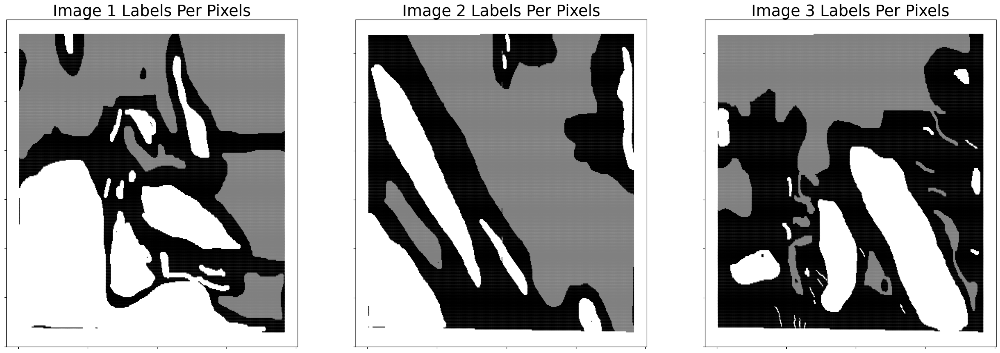

In [119]:
fig,ax = plt.subplots(1,3,figsize=(30,10))
for i in [1,2,3]:

    image = image_set[image_set['Image_no']==i]
    color_points = image['expert_label'].apply(lambda x: col_labels[x])

    ax[i-1].scatter(x=image['y coordinate'],y=image['x coordinate'], s=1,
                color=color_points)
    
    ax[i-1].set_title(f'Image {i} Labels Per Pixels')
    
    ax[i-1].set_yticklabels([])
    ax[i-1].set_xticklabels([])

# Correlation

In [131]:
import seaborn as sns
cmap1 = sns.color_palette("viridis", as_cmap=True)

In [124]:
image = image_set[image_set['Image_no']==i]
color_points = image['expert_label'].apply(lambda x: cmap(x))

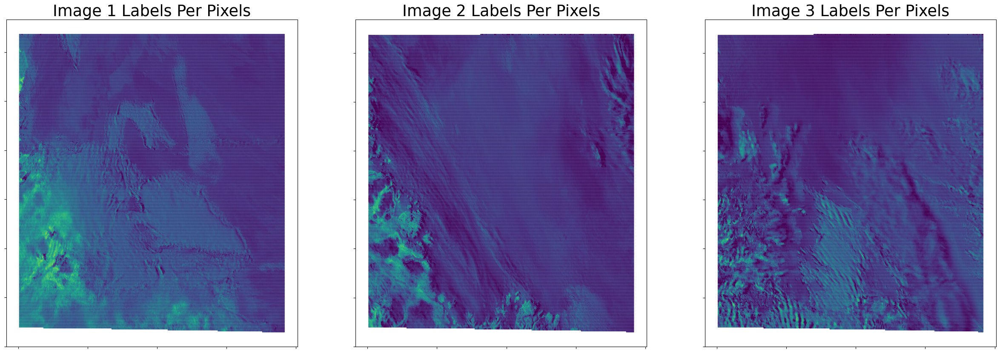

In [133]:
#cmap = matplotlib.cm.get_cmap('Spectral')
cmap = sns.color_palette("viridis", as_cmap=True)

fig,ax = plt.subplots(1,3,figsize=(30,10))
for i in [1,2,3]:

    image = image_set[image_set['Image_no']==i]
    color_points = image['CORR'].apply(lambda x: cmap(x))

    ax[i-1].scatter(x=image['y coordinate'],y=image['x coordinate'], s=1,
                color=color_points)
    
    ax[i-1].set_title(f'Image {i} Labels Per Pixels')
    
    ax[i-1].set_yticklabels([])
    ax[i-1].set_xticklabels([])

In [162]:
from sklearn.preprocessing import MinMaxScaler

def scale_features(input_features):
    scaler = MinMaxScaler(feature_range=(-1,1))
    out_vals = scaler.fit_transform(input_features.reshape(-1,1)).squeeze()
    return out_vals

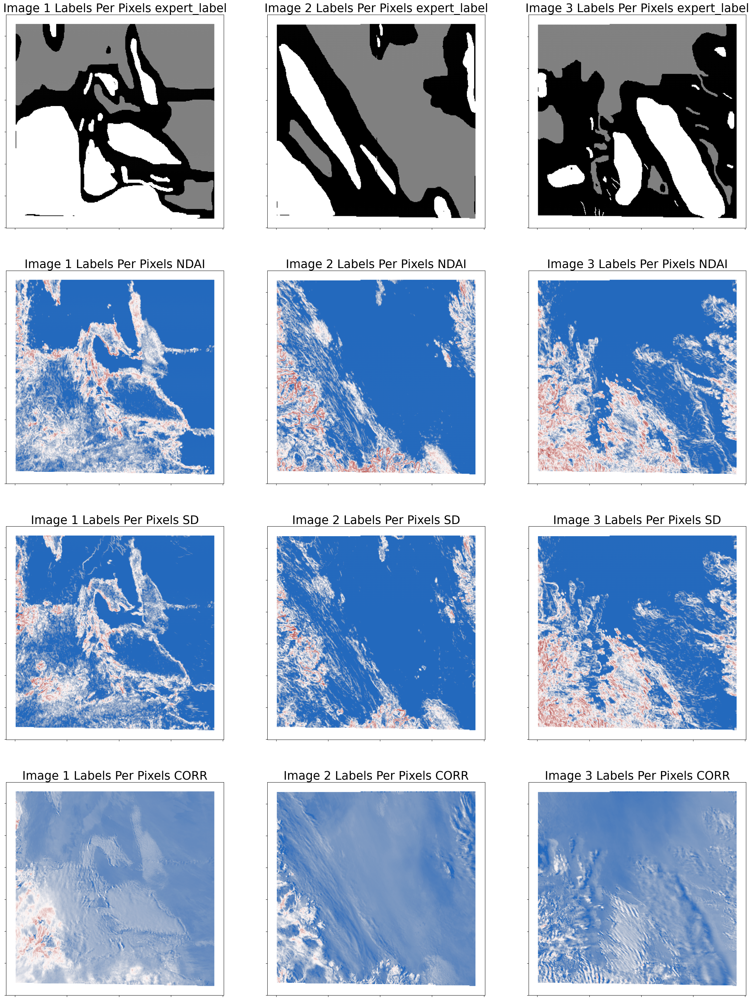

In [174]:
import seaborn as sns

# Define color maps
col_labels={1:'white',  # Cloud
            -1:'gray', # Non Cloud
            0:'black'}  # Unlabelled

cmap = sns.color_palette("vlag", as_cmap=True)

# Plot colors maps for all
fig,ax = plt.subplots(4,3,figsize=(30,40))
plot_features = ['expert_label','NDAI','SD','CORR']

for j,feat in enumerate(plot_features):
    for i in [1,2,3]:

        image = image_set[image_set['Image_no']==i]
        
        if feat == 'expert_label':
            color_points = image[feat].apply(lambda x: col_labels[x])
        else:
            if feat == 'CORR':
                feature_vals = image[feat].values
                color_points = cmap(feature_vals)
            
            elif feat =='NDAI':
                
                feature_vals = image[feat].values
                scaled_values = scale_features(feature_vals)
                color_points = cmap(scaled_values)
            
            else: # SD
                feature_vals = np.log(image[feat].values)
                scaled_values = scale_features(feature_vals)
                color_points = cmap(scaled_values)
                

        ax[j, i-1].scatter(x=image['y coordinate'],y=image['x coordinate'], s=1,
                    color=color_points)

        ax[j, i-1].set_title(f'Image {i} Labels Per Pixels {feat}')

        ax[j, i-1].set_yticklabels([])
        ax[j, i-1].set_xticklabels([])


In [179]:
from scipy.stats import spearmanr

In [182]:
image_set['Log_SD'] = np.log(image_set['SD'].copy())

In [183]:
image_set.head()

,y coordinate,x coordinate,expert_label,NDAI,SD,CORR,Radiance angle DF,Radiance angle CF,Radiance angle BF,Radiance angle AF,Radiance angle AN,Image_no,named_label,Log_SD
0,352.0,65.0,0.0,1.716874,14.327700,0.198324,286.80087,213.60213,215.52872,200.47234,184.52251,1,unlabeled,2.662195
1,353.0,65.0,0.0,1.498417,11.641967,0.233821,256.42563,232.64897,228.68259,196.27235,181.85898,1,unlabeled,2.454616
2,354.0,65.0,0.0,2.098988,12.378335,0.250463,242.92738,244.57222,230.25035,189.34863,186.37204,1,unlabeled,2.515948
3,355.0,65.0,0.0,2.573375,10.942639,0.222701,255.12035,262.46069,223.46631,194.81055,201.93175,1,unlabeled,2.392667
4,356.0,65.0,0.0,2.155032,6.143290,0.207314,269.60358,269.86124,214.79903,204.70364,214.31015,1,unlabeled,1.815360


In [209]:
image_data_plot = image_set[image_set['expert_label'].isin([1,-1])]

image_data_plot = image_data_plot[['named_label',
                        'NDAI',
                        'CORR',
                        'Log_SD']]#.sample(300000)


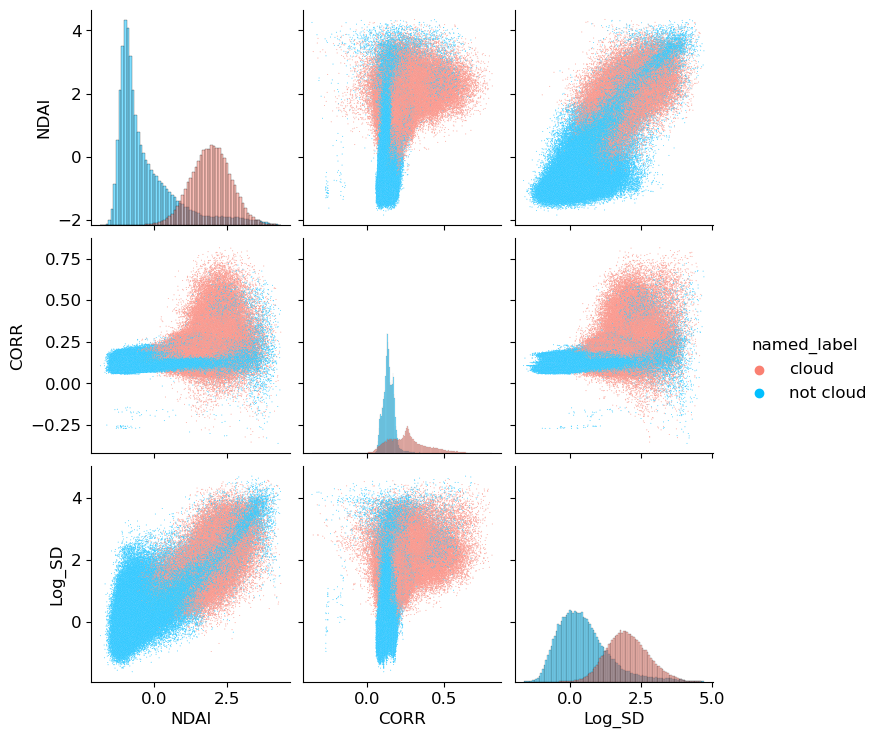

In [214]:
matplotlib.rcParams.update({'font.size': 12})
sns.pairplot(image_data_plot,
             hue="named_label",
             palette={'cloud':'salmon',
                      'not cloud':'deepskyblue'},
             diag_kind="hist",
             plot_kws={'s':0.5,
                       'alpha':0.8})

In [180]:
spearmanr(image_set['NDAI'],image_set['SD'])

SpearmanrResult(correlation=0.8234393400187396, pvalue=0.0)

In [56]:
imagem3.head()

,y coordinate,x coordinate,expert label,NDAI,SD,CORR,Radiance angle DF,Radiance angle CF,Radiance angle BF,Radiance angle AF,Radiance angle AN
0,377.0,65.0,0.0,2.628045,3.091398,0.240855,316.51627,285.72919,228.16722,192.72018,201.23816
1,378.0,65.0,0.0,2.759933,4.985404,0.297055,320.93060,268.79681,221.58546,222.15141,188.02411
2,379.0,65.0,0.0,2.750287,5.443144,0.313928,324.36234,265.56491,250.23401,208.03424,182.68742
3,380.0,65.0,0.0,2.545062,5.420574,0.292590,325.52551,277.07153,251.90051,197.80641,184.45508
4,381.0,65.0,0.0,2.624430,15.616846,0.259422,326.61646,294.17010,234.11559,197.38979,191.29210


<AxesSubplot:>

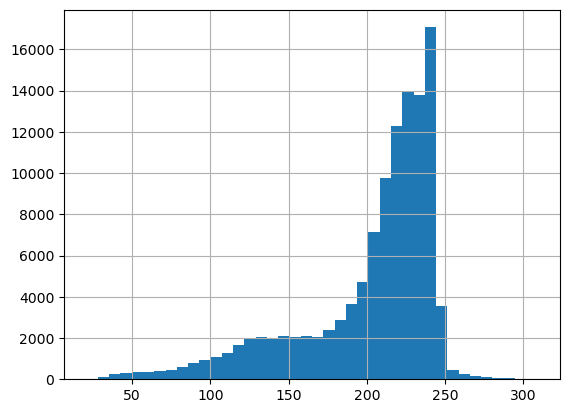

In [33]:
imagem1.iloc[:,9].hist(bins=40)

In [36]:
imagem3

,0,1,2,3,4,5,6,7,8,9,10
0,377.0,65.0,0.0,2.628045,3.091398,0.240855,316.51627,285.72919,228.16722,192.72018,201.23816
1,378.0,65.0,0.0,2.759933,4.985404,0.297055,320.93060,268.79681,221.58546,222.15141,188.02411
2,379.0,65.0,0.0,2.750287,5.443144,0.313928,324.36234,265.56491,250.23401,208.03424,182.68742
3,380.0,65.0,0.0,2.545062,5.420574,0.292590,325.52551,277.07153,251.90051,197.80641,184.45508
4,381.0,65.0,0.0,2.624430,15.616846,0.259422,326.61646,294.17010,234.11559,197.38979,191.29210
...,...,...,...,...,...,...,...,...,...,...,...
115212,379.0,369.0,0.0,0.899586,7.274280,0.166494,285.90018,253.06851,232.96445,217.94420,197.01410
115213,380.0,369.0,0.0,0.978644,6.150077,0.172718,289.38974,251.89571,238.71776,212.78091,195.30424
115214,381.0,369.0,0.0,1.458705,4.054374,0.185392,284.39743,255.10349,237.82912,215.75751,194.43245
115215,382.0,369.0,0.0,2.343423,4.902957,-0.185016,276.62604,257.89224,234.09392,213.71532,205.44537


In [34]:
imagem1

,0,1,2,3,4,5,6,7,8,9,10
0,352.0,65.0,0.0,1.716874,14.327700,0.198324,286.80087,213.60213,215.52872,200.47234,184.52251
1,353.0,65.0,0.0,1.498417,11.641967,0.233821,256.42563,232.64897,228.68259,196.27235,181.85898
2,354.0,65.0,0.0,2.098988,12.378335,0.250463,242.92738,244.57222,230.25035,189.34863,186.37204
3,355.0,65.0,0.0,2.573375,10.942639,0.222701,255.12035,262.46069,223.46631,194.81055,201.93175
4,356.0,65.0,0.0,2.155032,6.143290,0.207314,269.60358,269.86124,214.79903,204.70364,214.31015
...,...,...,...,...,...,...,...,...,...,...,...
115105,379.0,368.0,-1.0,-1.182242,2.135993,0.126727,306.69785,295.12860,267.15918,246.79744,233.15230
115106,380.0,368.0,-1.0,-0.887624,2.086403,0.131109,306.26193,293.01416,266.77869,247.13219,233.18600
115107,381.0,368.0,-1.0,-0.902142,2.232073,0.132625,304.81940,290.76965,267.12067,247.40190,233.66284
115108,382.0,368.0,-1.0,-1.088044,2.063873,0.133355,303.55988,290.41806,268.57043,247.76555,233.53761


# Question  Split

- Logistic
- Random Forest
- AdaBoost

In [164]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from cv_master import Grid2DKernel, SatelliteImageData
from cv_master.cv import cv_classifer
from tqdm import tqdm

sns.set_style('whitegrid')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Import Full Data

In [165]:
import pandas as pd
COLUMNES = ['y', 'x', 'label', 'ndai', 'sd', 'corr', 'ra_df', 'ra_cf', 'ra_bf', 'ra_af', 'ra_an']
train_columns = ['ndai', 'sd', 'corr', 'ra_df', 'ra_cf', 'ra_bf', 'ra_af', 'ra_an']

imagem1 = pd.read_csv('cv_master/data/imagem1.txt',delim_whitespace=True, header=None)
imagem2 = pd.read_csv('cv_master/data/imagem2.txt',delim_whitespace=True, header=None)
imagem3 = pd.read_csv('cv_master/data/imagem3.txt',delim_whitespace=True, header=None)

imagem1.columns = COLUMNES
imagem2.columns = COLUMNES
imagem3.columns = COLUMNES

imagem1['Image_no'] = 1
imagem2['Image_no'] = 2
imagem3['Image_no'] = 3

image_set = pd.concat([imagem1, imagem2, imagem3],0)
remap_labels = {1:1,
                -1:0,
                0:2}


image_set['label'] = image_set['label'].apply(lambda x: remap_labels[x])
image_set = image_set[image_set['label']!=2]

/var/folders/0p/10_vdl_n673_r_lydsdd278m0000gn/T/ipykernel_79866/2039683818.py:17: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  image_set = pd.concat([imagem1, imagem2, imagem3],0)


In [166]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, balanced_accuracy_score

#### Test scheme 1 (CV + Fixed test set) ####
kernel = Grid2DKernel(55, 55)
image_test1 = SatelliteImageData(kernel, images=['imagem1.txt', 'imagem2.txt'])

# Load test set
COLUMNES = ['y', 'x', 'label', 'ndai', 'sd', 'corr', 'ra_df', 'ra_cf', 'ra_bf', 'ra_af', 'ra_an']
train_columns = ['ndai', 'sd', 'corr', 'ra_df', 'ra_cf', 'ra_bf', 'ra_af', 'ra_an']

X_train_1 = image_set[image_set['Image_no'].isin([1,2])][train_columns]
y_train_1 = image_set[image_set['Image_no'].isin([1,2])][['label']]

X_test_1 = image_set[image_set['Image_no'].isin([3])][train_columns]
y_test_1 = image_set[image_set['Image_no'].isin([3])][['label']]


#### Test scheme 2 (Nested CV + Testing)####
image_test2 = SatelliteImageData(kernel, images=['imagem1.txt', 'imagem2.txt', 'imagem3.txt'])


In [167]:
metric_list = [accuracy_score, balanced_accuracy_score]

### Logistic Regression

In [168]:
lr_clf = LogisticRegression(penalty='l2', max_iter=1000)
cv_scores_lr = cv_classifer(lr_clf, image_test1, metric_list, n_jobs=8, verbose=True)

lr_acc = [x[0][0] for x in cv_scores_lr]
lr_balanced_acc = [x[0][1] for x in cv_scores_lr]

print(np.mean(lr_acc))
print(np.mean(lr_balanced_acc))

/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006

0.88089589947344
0.869768086761952


In [169]:
max([len(x[2][0]) for x in cv_scores_lr])

5609

In [171]:
test_preds_lr

array([[0.58827457, 0.41172543],
       [0.34113053, 0.65886947],
       [0.39135433, 0.60864567],
       ...,
       [0.99616677, 0.00383323],
       [0.97848496, 0.02151504],
       [0.94730516, 0.05269484]])

In [172]:
# Retrain on Train set 
lr_clf = LogisticRegression(penalty='l2', max_iter=1000)
lr_clf.fit(X_train_1, y_train_1)

# Test on Test Set
test_preds_lr = lr_clf.predict(X_test_1)
test_scores_lr = lr_clf.predict_proba(X_test_1)

print(accuracy_score(test_preds_lr, y_test_1.values))

/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.7697105244017747


## Random Forest

In [173]:
from sklearn.ensemble import RandomForestClassifier

RF_clf = RandomForestClassifier(n_estimators=100)
cv_scores_rf = cv_classifer(RF_clf, image_test1, metric_list, n_jobs=8, verbose=True)

rf_acc = [x[0][0] for x in cv_scores_rf]
rf_balanced_acc = [x[0][1] for x in cv_scores_rf]

print(np.mean(rf_acc))
print(np.mean(rf_balanced_acc))

/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006

0.8797576238578544
0.8789189704375896


In [174]:
# Retrain on Train set 
RF_clf = RandomForestClassifier(n_estimators=500,
                                min_samples_split=5,
                                min_samples_leaf=5,
                                max_depth=3)

RF_clf.fit(X_train_1, y_train_1.values.reshape(-1))

# Test on Test Set
test_preds_rf = RF_clf.predict(X_test_1)
test_score_rf = RF_clf.predict_proba(X_test_1)


print(accuracy_score(test_preds_rf, y_test_1.values))

print(balanced_accuracy_score(test_preds_rf, y_test_1.values))

0.5118917739471962
0.6542395435336371


 ## CART

In [175]:
from sklearn.tree import DecisionTreeClassifier

CART_clf = DecisionTreeClassifier(min_samples_split=10)
cv_scores_CART = cv_classifer(CART_clf, image_test1, metric_list, n_jobs=8, verbose=True)

CART_acc = [x[0][0] for x in cv_scores_CART]
CART_balanced_acc = [x[0][1] for x in cv_scores_CART]

print(np.mean(CART_acc))
print(np.mean(CART_balanced_acc))

/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006

0.8724683889299294
0.8677027024509892


In [176]:
# Retrain on Train set 
CART_clf = DecisionTreeClassifier(min_samples_split=10)
CART_clf.fit(X_train_1, y_train_1)

# Test on Test Set
test_preds_CART = CART_clf.predict(X_test_1)
test_score_CART = CART_clf.predict_proba(X_test_1)

print(accuracy_score(test_preds_CART, y_test_1.values))

0.7623281693214052


# Adaboost

In [177]:
from sklearn.ensemble import AdaBoostClassifier

ada_clf = AdaBoostClassifier()
cv_scores_ada = cv_classifer(ada_clf, image_test1, metric_list, n_jobs=8, verbose=True)

ada_acc = [x[0][0] for x in cv_scores_ada]
ada_balanced_acc = [x[0][1] for x in cv_scores_ada]

print(np.mean(ada_acc))
print(np.mean(ada_balanced_acc))

/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2006

0.8841088744104595
0.8748896275679527


In [178]:
# Retrain on Train set 
ada_clf = AdaBoostClassifier()
ada_clf.fit(X_train_1, y_train_1)

# Test on Test Set
test_preds_ada = ada_clf.predict(X_test_1)
test_score_ada = ada_clf.predict_proba(X_test_1)
print(accuracy_score(test_preds_ada, y_test_1.values))

/Users/tzehongti/miniforge3/envs/pymc_env_4/lib/python3.10/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.7882936940868427


# ROC Curves

In [144]:
from sklearn.metrics import roc_curve, auc

In [181]:
test_scores = [test_scores_lr, test_score_rf, test_score_CART, test_score_ada]

fpr_tpr_col = []
roc_col = []

for ts in test_scores:

    fpr, tpr, _ = roc_curve(y_test_1.values,ts[:,1])
    roc_auc = auc(fpr, tpr)
    
    fpr_tpr_col.append((fpr, tpr))
    roc_col.append(roc_auc)


In [185]:
model_names = ['LR', 'RF','CART', 'Ada']
model_colors = ['darkorange','red','green','mediumblue']

In [191]:
"ROC curve  %s (area = %0.2f)" % ('ss', 123)

'ROC curve  ss (area = 123.00)'

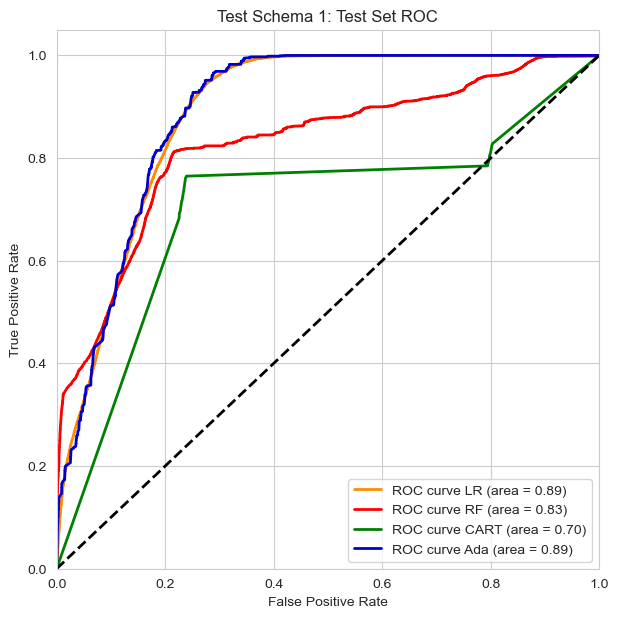

In [195]:
fig, ax = plt.subplots(figsize=(7,7))

lw = 2

for fpr_tpr, roc, mod_name, mod_col in zip(fpr_tpr_col,
                                           roc_col,
                                           model_names,
                                           model_colors):

    ax.plot(
        fpr_tpr[0],
        fpr_tpr[1],
        color=mod_col,
        lw=lw,
        label="ROC curve %s (area = %0.2f)" % (mod_name,roc),
    )
ax.plot([0, 1], [0, 1], color="black", lw=lw, linestyle="--")
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.title.set_text("Test Schema 1: Test Set ROC")
ax.legend(loc="lower right")
plt.show()

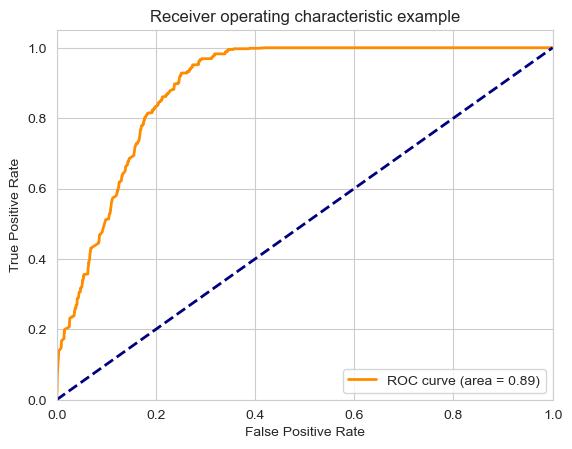

In [160]:
fig, ax = plt.subplots(figsize=(5,5))

plt.figure()
lw = 2
plt.plot(
    fpr,
    tpr,
    color="darkorange",
    lw=lw,
    label="ROC curve (area = %0.2f)" % roc_auc,
)
plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic example")
plt.legend(loc="lower right")
plt.show()

- Fit Adaboost + Grid Search
- Test scheme 1 
- Test scheme 2

- Fit SVM + Grid Search
- Test scheme 1 
- Test scheme 2

- Fit Random Forest + Grid Search
- Test scheme 1
- Test scheme 2

In [ ]:
LR_grid = {'C':[10**i for i in np.linspace(0,2,3)] ,
           'penalty':['elasticnet'],
           'solver':['saga'],
           'max_iter':[200],
           'l1_ratio':[0.25,0.75]}

LR_grid = ParameterGrid(LR_grid)
print("No Grid Candidates: ", len(LR_grid))

In [230]:
param_grid = LR_grid
estimator_clf = LogisticRegression()
image = image
accuracy_score = accuracy_score
n_jobs=8

0.6804451827052114

In [226]:
cv_score_store = []
i = 1
for p_cand in LR_grid:
    i += 1
    clf_p = estimator_clf.set_params(**p_cand)
    cv_scores = cv_classifer(clf_p, image, accuracy_score, n_jobs=8)
    cv_score_store.append(cv_scores)
    print(i)